<a href="https://colab.research.google.com/github/EdilsonPs/MAC04592021-Atividades/blob/main/xploratory_analysis_on_Cenipa_dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

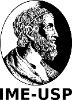 
# MAC0459 - General Test - 2021 - Tarefa 1:
<br />

**Task 1** : A realização da **análise exploratória de dados** baseada em métodos Python utilizada
para estudo do conjunto de dados do Centro de investigação e prevenção de acidentes aéreos
da Força Aérea - ***CENIPA*** baseou-se em 5 dos conjuntos de dados disponibilizados no [site do CENIPA](https://https://dados.gov.br/dataset/ocorrencias-aeronauticas-da-aviacao-civil-brasileira), sendo eles:
<br /> 
<br /> 
Ocorrências, Tipos de ocorrências, recomendações e descrição de aeronaves, todos com
cobertura de janeiro de 2010 a agosto 2021; Os conjuntos de dados analisados possuem alto
teor de dados registrados e de fato, chega a existir dados tipo ‘NAN’, contudo, a quantidade
total de dados deste tipo se mostrou irrelevante para o estudo, o que não impactou de modo
significativo as conclusões, prosseguindo para visualização e descrição de informações
relevantes para o estudo, foram utilizadas as bibliotecas PANDAS para tratamento de
dataframes, o MATPLOTLIB para base e plotagem de gráficos através do SEABORN. 
<br />
<br />

Em última instância, a estratégia de abordagem dos datasets utilizou, majoritariamente, métodos
do PANDAS para filtragem da maior parte das questões idealizadas para o projeto, esta
metodologia foi utilizada de modo a produzir insights úteis que simulassem questões de uma
situação real de tomada de decisões, não baseando-se apenas em reprodução de códigos ou
criação dos mesmos sem sentido determinado, nessa ordem, as questões foram idealizadas
inicialmente e em seguida respondidas com utilização do Python.




## `Task` 1:

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
from neo4j import GraphDatabase
from IPython.display import Image


In [ ]:
ocurrences = pd.read_csv('C:/Users/Edson/.Neo4jDesktop/relate-data/dbmss/dbms-c9869f98-2368-4944-b484-1f52a5e25354/import/ocorrencia.csv' , error_bad_lines= False, sep = ';')

In [ ]:
ocurrence_types = pd.read_csv('C:/Users/Edson/.Neo4jDesktop/relate-data/dbmss/dbms-c9869f98-2368-4944-b484-1f52a5e25354/import/ocorrencia_tipo.csv', error_bad_lines= False, sep = ';')

In [ ]:
aircrafts = pd.read_csv('C:/Users/Edson/.Neo4jDesktop/relate-data/dbmss/dbms-c9869f98-2368-4944-b484-1f52a5e25354/import/aeronave.csv', error_bad_lines= False, sep = ';')

In [ ]:
recomendations = pd.read_csv('C:/Users/Edson/.Neo4jDesktop/relate-data/dbmss/dbms-c9869f98-2368-4944-b484-1f52a5e25354/import/recomendacao.csv', error_bad_lines= False, sep = ';')

 **`1` - In which state of Brazil the most aircraft _incidents/accidents_ occurred ?** 
 
 **_São Paulo_** is the state with the highest number of aircraft occurrences according to the **CENIPA** dataset.

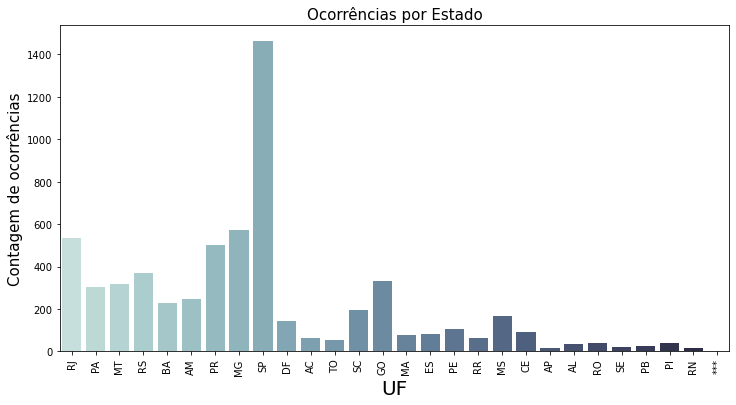

In [ ]:
plt.figure(figsize=[12,6])
x = sns.countplot(x = ocurrences['ocorrencia_uf'],palette="ch:s=.13,rot=-.30" )
plt.title('Ocorrências por Estado', size = 15)
plt.xlabel('UF', size = 20)
plt.ylabel('Contagem de ocorrências', size = 15)
x.set_xticklabels(x.get_xticklabels(), rotation = 90)
plt.show()

 **`2` - What is the most frequent type of occurrence among aircraft according to the CENIPA dataset?** 
 
 Occurrences of **`engine failure during flight`** are the most frequent events according to the dataset with **_`12,43%`_**
 of the total cases.

In [ ]:
(ocurrence_types['ocorrencia_tipo'].value_counts(normalize=True).head(1))*100

FALHA DO MOTOR EM VOO    12.430368
Name: ocorrencia_tipo, dtype: float64

**`3` - Of the total number of occurrences, how many occurred while the aircraft was taking off?**


Of the **_`6114`_** total occurrences, **_`538`_** occurred while `the aircraft took off`.

In [ ]:
len(ocurrences['ocorrencia_saida_pista'].loc[ocurrences['ocorrencia_saida_pista'] == 'SIM'])

538

**`4` - Considering the period of time covered by the CENIPA dataset, which was the day, month and year with the highest number of occurrences?**

**_Day_** - On **_`18/12/2013`_**, the highest number of occurrences in a single day was registered, with a total of **` 9 occurrences`**.

**_Month_** - The month with the highest number of occurrences was **_`January 2014`_** with **_`68`_** events.

**_Year_** - The year with the `highest` number of occurrences was **_`2013`_** with **_`654`_** occurrences.

In [ ]:
ocurrences['ocorrencia_dia'].value_counts().head(1)

18/12/2013    9
Name: ocorrencia_dia, dtype: int64

In [ ]:
month = []
for i in range(0, len(ocurrences['ocorrencia_dia'])):
  m =  ocurrences['ocorrencia_dia'][i][3:]
  month.append(m)
pd.DataFrame(month).value_counts().head(1)

01/2014    68
dtype: int64

In [ ]:
year = []
for i in range(0, len(ocurrences['ocorrencia_dia'])):
  y =  ocurrences['ocorrencia_dia'][i][6:]
  year.append(y)
pd.DataFrame(year).value_counts().head(1)

2013    654
dtype: int64

`5` - **What is the average number of occurrences per year?**

Considering the `6114` occurrences collected between `2010` and `2021`, there is an average of `556` cases per year.

In [ ]:
total_ocurrences = len(ocurrences)
total_years = 11
mean_ocurrences = total_ocurrences/total_years
print(f'{mean_ocurrences:.0f}')

556


`6` - **What is the proportion of accident cases in relation to the total number of occurrences?**

`1930` cases or `31%` of the total occurrences were accidents.

In [ ]:
len(ocurrences.loc[ocurrences['ocorrencia_classificacao'] == 'ACIDENTE'])

1930

`7` - **Regarding aircraft size, what is the most common size of aircraft and what is the engine model of these aircraft?**

As expected, there are more smaller aircraft models than larger ones present in the CENIPA dataset, the size was measured by the number of seats, thus, the most common size is 6 seats, and the vast majority of `6-seat` aircraft have `piston-powered engines`.

In [ ]:
aircrafts['aeronave_assentos'].value_counts().head(1)

6.0    1021
Name: aeronave_assentos, dtype: int64

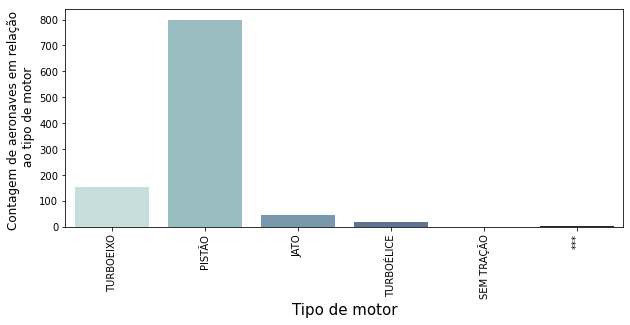

In [ ]:
common_model = aircrafts.groupby('aeronave_assentos').get_group(6.0)
plt.figure(figsize=[10,4])
model = sns.countplot(x = 'aeronave_motor_tipo', data = common_model, palette="ch:s=.13,rot=-.30" )
plt.ylabel('Contagem de aeronaves em relação \n ao tipo de motor', size = 12)
plt.xlabel('Tipo de motor', size = 15)
model.set_xticklabels(model.get_xticklabels(), rotation = 90)
plt.show()

`8` - **If it were possible to measure the efficiency of the recommendations aplication made by ANAC, what would be the level of this indicator in relation to the total of recommendations made according to CENIPA's DATASET?**



Adding the `fulfilled` and `alternatively fulfilled` recommendations, we have the number of `1277` fulfilled recommendations out of a total of `1811`. It is necessary not to consider the `61` recommendations that do not have status. Thus, the ratio of recommendations fulfilled in relation to all that were opened is `71%`.

In [ ]:
recomendations['recomendacao_status'].value_counts()

CUMPRIDA                         1155
AGUARDANDO RESPOSTA               416
CUMPRIDA DE FORMA ALTERNATIVA     122
NÃO CUMPRIDA                      118
***                                61
Name: recomendacao_status, dtype: int64

## `Task` 2:

In [ ]:
uri = "bolt://localhost:7687"
driver = GraphDatabase.driver(uri, auth=("neo4j", "123"))

In [ ]:
session = driver.session()

 **`1` - In which state of Brazil the most aircraft _incidents/accidents_ occurred ?** 
 
 **_São Paulo_** is the state with the highest number of aircraft occurrences according to the **CENIPA** dataset.

In [ ]:
q1 = 

nodes_q1 = session.run(q1)
for node in nodes_q1:
    print(node)

<Record o=<Node id=9365 labels=frozenset({'codigo_ocorrencia'}) properties={'name': '39527'}> e=<Node id=10764 labels=frozenset({'ocorrencia_uf'}) properties={'name': 'MT'}>>
<Record o=<Node id=9366 labels=frozenset({'codigo_ocorrencia'}) properties={'name': '39707'}> e=<Node id=10765 labels=frozenset({'ocorrencia_uf'}) properties={'name': 'AM'}>>
<Record o=<Node id=9367 labels=frozenset({'codigo_ocorrencia'}) properties={'name': '39156'}> e=<Node id=10766 labels=frozenset({'ocorrencia_uf'}) properties={'name': 'PR'}>>
<Record o=<Node id=9368 labels=frozenset({'codigo_ocorrencia'}) properties={'name': '40069'}> e=<Node id=10767 labels=frozenset({'ocorrencia_uf'}) properties={'name': 'SP'}>>
<Record o=<Node id=9369 labels=frozenset({'codigo_ocorrencia'}) properties={'name': '39507'}> e=<Node id=10764 labels=frozenset({'ocorrencia_uf'}) properties={'name': 'MT'}>>
<Record o=<Node id=9370 labels=frozenset({'codigo_ocorrencia'}) properties={'name': '40107'}> e=<Node id=10768 labels=frozens

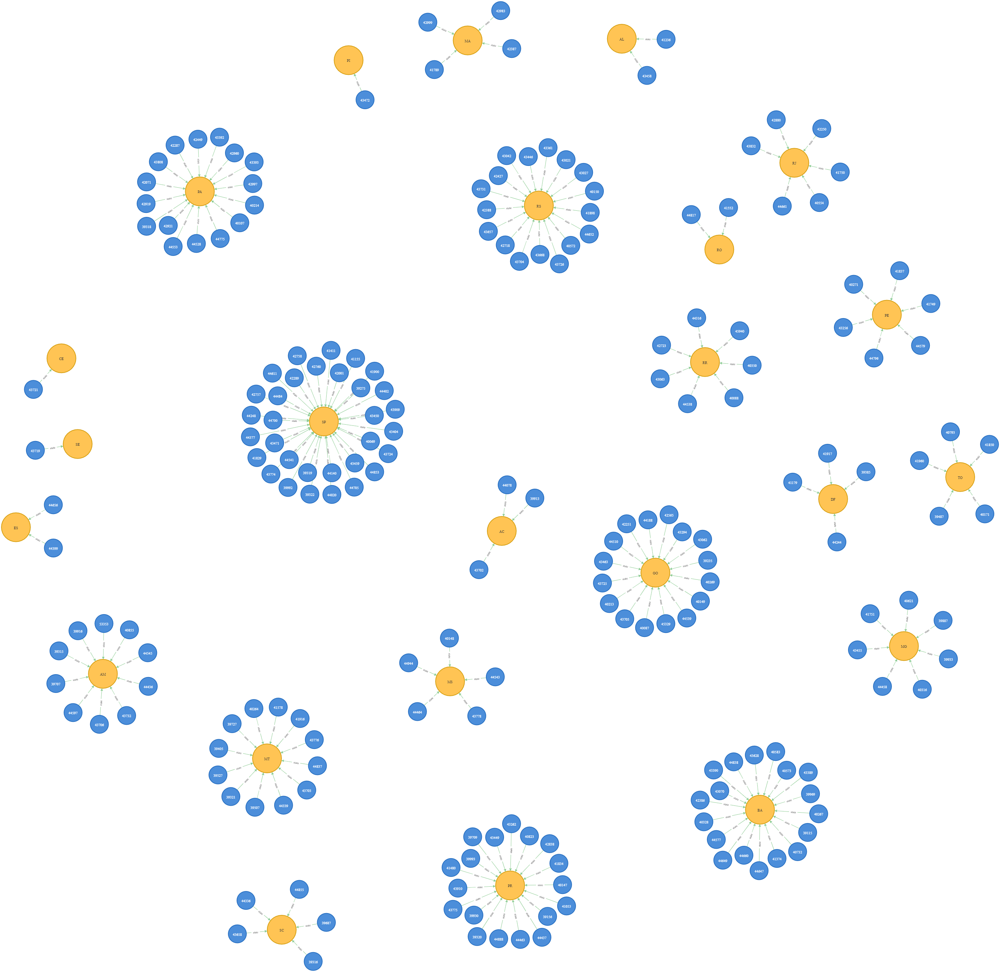

In [ ]:
q1_image = Image(filename='graph1.png')
q1_image

 **`2` - What is the most frequent type of occurrence among aircraft according to the CENIPA dataset?** 
 
 Occurrences of the **'accident'** type are the most common according to the CENIPA dataset.

In [ ]:
q2 = '''load csv with headers from "file:///ocurrences.csv" as row 
merge (o:codigo_ocorrencia1{name:row.codigo_ocorrencia1}) 
merge (t:ocorrencia_classificacao{name:row.ocorrencia_classificacao})
merge (o) -[:tipo] -> (t) 
return o,t'''
nodes_q2 = session.run(q2)
for node in nodes_q2:
    print(node)

<Record o=<Node id=174691 labels=frozenset({'codigo_ocorrencia1'}) properties={'name': '39527'}> t=<Node id=176090 labels=frozenset({'ocorrencia_classificacao'}) properties={'name': 'ACIDENTE'}>>
<Record o=<Node id=174692 labels=frozenset({'codigo_ocorrencia1'}) properties={'name': '39707'}> t=<Node id=176091 labels=frozenset({'ocorrencia_classificacao'}) properties={'name': 'INCIDENTE GRAVE'}>>
<Record o=<Node id=174693 labels=frozenset({'codigo_ocorrencia1'}) properties={'name': '39156'}> t=<Node id=176091 labels=frozenset({'ocorrencia_classificacao'}) properties={'name': 'INCIDENTE GRAVE'}>>
<Record o=<Node id=174694 labels=frozenset({'codigo_ocorrencia1'}) properties={'name': '40069'}> t=<Node id=176090 labels=frozenset({'ocorrencia_classificacao'}) properties={'name': 'ACIDENTE'}>>
<Record o=<Node id=174695 labels=frozenset({'codigo_ocorrencia1'}) properties={'name': '39507'}> t=<Node id=176090 labels=frozenset({'ocorrencia_classificacao'}) properties={'name': 'ACIDENTE'}>>
<Recor

<Record o=<Node id=175294 labels=frozenset({'codigo_ocorrencia1'}) properties={'name': '49892'}> t=<Node id=176090 labels=frozenset({'ocorrencia_classificacao'}) properties={'name': 'ACIDENTE'}>>
<Record o=<Node id=175295 labels=frozenset({'codigo_ocorrencia1'}) properties={'name': '50095'}> t=<Node id=176091 labels=frozenset({'ocorrencia_classificacao'}) properties={'name': 'INCIDENTE GRAVE'}>>
<Record o=<Node id=175296 labels=frozenset({'codigo_ocorrencia1'}) properties={'name': '50091'}> t=<Node id=176090 labels=frozenset({'ocorrencia_classificacao'}) properties={'name': 'ACIDENTE'}>>
<Record o=<Node id=175297 labels=frozenset({'codigo_ocorrencia1'}) properties={'name': '50053'}> t=<Node id=176090 labels=frozenset({'ocorrencia_classificacao'}) properties={'name': 'ACIDENTE'}>>
<Record o=<Node id=175298 labels=frozenset({'codigo_ocorrencia1'}) properties={'name': '50291'}> t=<Node id=176090 labels=frozenset({'ocorrencia_classificacao'}) properties={'name': 'ACIDENTE'}>>
<Record o=<No

<Record o=<Node id=175830 labels=frozenset({'codigo_ocorrencia1'}) properties={'name': '66786'}> t=<Node id=176090 labels=frozenset({'ocorrencia_classificacao'}) properties={'name': 'ACIDENTE'}>>
<Record o=<Node id=175831 labels=frozenset({'codigo_ocorrencia1'}) properties={'name': '66787'}> t=<Node id=176091 labels=frozenset({'ocorrencia_classificacao'}) properties={'name': 'INCIDENTE GRAVE'}>>
<Record o=<Node id=175832 labels=frozenset({'codigo_ocorrencia1'}) properties={'name': '66800'}> t=<Node id=176090 labels=frozenset({'ocorrencia_classificacao'}) properties={'name': 'ACIDENTE'}>>
<Record o=<Node id=175833 labels=frozenset({'codigo_ocorrencia1'}) properties={'name': '66801'}> t=<Node id=176090 labels=frozenset({'ocorrencia_classificacao'}) properties={'name': 'ACIDENTE'}>>
<Record o=<Node id=175834 labels=frozenset({'codigo_ocorrencia1'}) properties={'name': '66816'}> t=<Node id=176090 labels=frozenset({'ocorrencia_classificacao'}) properties={'name': 'ACIDENTE'}>>
<Record o=<No

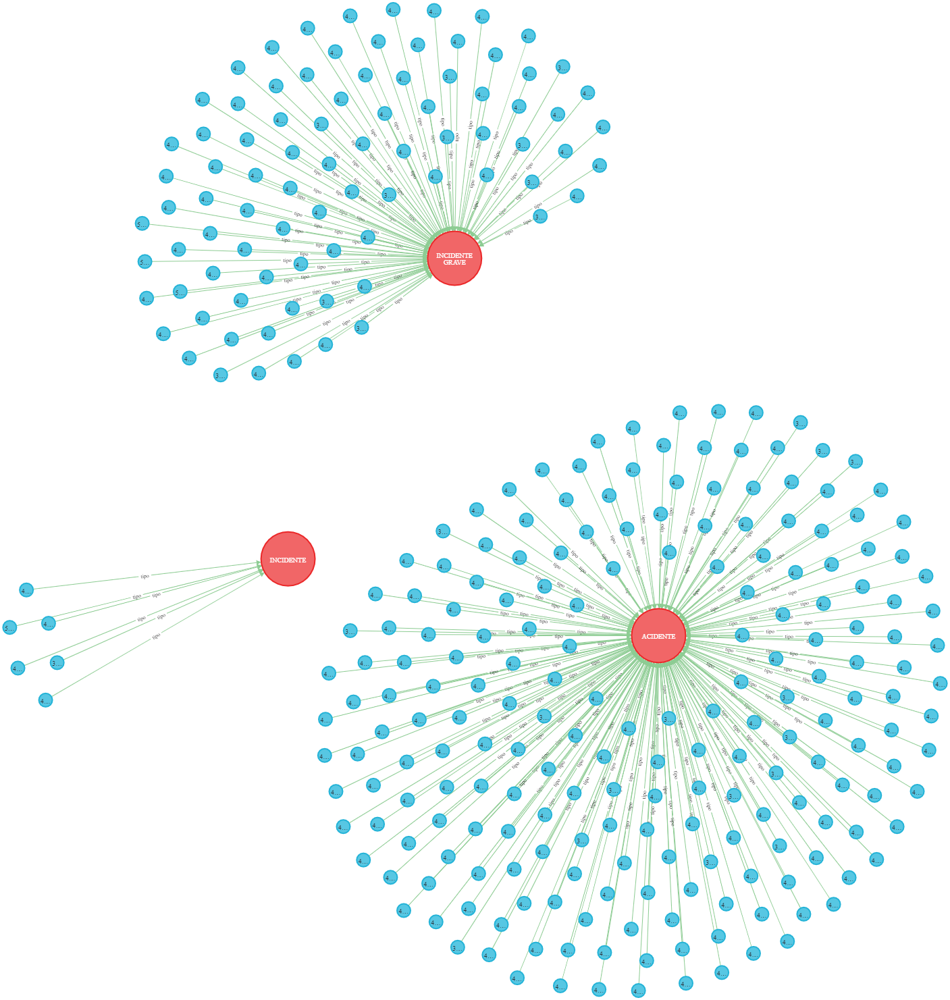

In [ ]:
q2_image = Image(filename='graph2.png')
q2_image

In [ ]:
q3 = '''load csv with headers from "file:///aeronaves.csv" as row
merge (a:aeronave_motor_quantidade{name:row.aeronave_motor_quantidade})
merge (u:aeronave_pais_fabricante{name:row.aeronave_pais_fabricante})
merge (a) -[:motor] -> (u)
return a,u'''
nodes_q3 = session.run(q3)
for node in nodes_q3:
    print(node)

<Record a=<Node id=0 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'MONOMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=1 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'BIMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=1 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'BIMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=1 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'BIMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=1 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'BIMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=1 labels=froze

<Record a=<Node id=0 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'MONOMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=0 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'MONOMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=0 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'MONOMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=0 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'MONOMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=0 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'MONOMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=0 labe

<Record a=<Node id=1 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'BIMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=1 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'BIMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=0 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'MONOMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=0 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'MONOMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=0 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'MONOMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=0 labels=f

<Record a=<Node id=0 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'MONOMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=1 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'BIMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=0 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'MONOMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=0 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'MONOMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=1 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'BIMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=1 labels=f

<Record a=<Node id=0 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'MONOMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=1 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'BIMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=1 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'BIMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=1 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'BIMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=1 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'BIMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=1 labels=froze

<Record a=<Node id=1 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'BIMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=1 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'BIMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=1 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'BIMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=1 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'BIMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=1 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'BIMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=0 labels=frozens

<Record a=<Node id=1 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'BIMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=1 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'BIMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=1 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'BIMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=1 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'BIMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=0 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'MONOMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=0 labels=froze

<Record a=<Node id=0 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'MONOMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=0 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'MONOMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=0 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'MONOMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=0 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'MONOMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=0 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'MONOMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=0 labe

<Record a=<Node id=3 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'SEM TRAÇÃO'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=1 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'BIMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=0 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'MONOMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=0 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'MONOMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=1 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'BIMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=1 labels=

<Record a=<Node id=0 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'MONOMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=1 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'BIMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=0 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'MONOMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=0 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'MONOMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=0 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'MONOMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=0 labels

<Record a=<Node id=0 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'MONOMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=1 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'BIMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=0 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'MONOMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=0 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'MONOMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=0 labels=frozenset({'aeronave_motor_quantidade'}) properties={'name': 'MONOMOTOR'}> u=<Node id=6 labels=frozenset({'aeronave_pais_fabricante'}) properties={'name': 'BRASIL'}>>
<Record a=<Node id=1 labels


 _`Neo4J's visualization advantages created conditions for new questions and instead of replicating research already done in Python, it was thought more interesting to complement the study with different approaches;`_




`3` - **Country of origin of engine types reported in the dataset:**

Below are the types of aircraft engines by manufacturing origin countries.


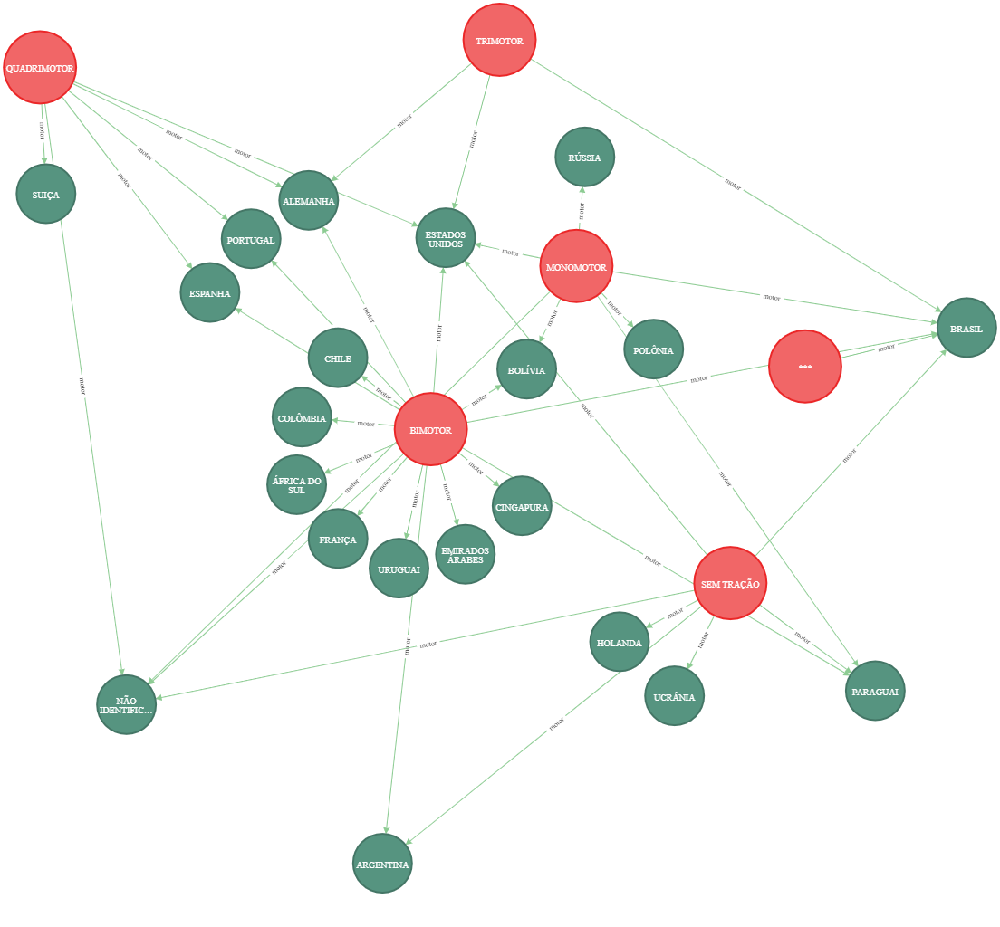

In [ ]:
q3_image = Image(filename='graph3.png')
q3_image


In [ ]:
q4 = '''load csv with headers from 'file:///factor_contribuinte.csv' as line
merge (r:fator_aspecto{name:line.fator_aspecto})
merge (c:fator_nome{name:line.fator_nome})
merge (r)  -[:relation] -> (c)
return r,c'''
nodes_q4 = session.run(q4)
for node in nodes_q4:
    print(node)

<Record r=<Node id=684 labels=frozenset({'fator_aspecto'}) properties={'name': 'DESEMPENHO DO SER HUMANO'}> c=<Node id=696 labels=frozenset({'fator_nome'}) properties={'name': 'APLICAÇÃO DE COMANDOS'}>>
<Record r=<Node id=684 labels=frozenset({'fator_aspecto'}) properties={'name': 'DESEMPENHO DO SER HUMANO'}> c=<Node id=697 labels=frozenset({'fator_nome'}) properties={'name': 'JULGAMENTO DE PILOTAGEM'}>>
<Record r=<Node id=685 labels=frozenset({'fator_aspecto'}) properties={'name': 'ASPECTO PSICOLÓGICO'}> c=<Node id=698 labels=frozenset({'fator_nome'}) properties={'name': 'PERCEPÇÃO'}>>
<Record r=<Node id=684 labels=frozenset({'fator_aspecto'}) properties={'name': 'DESEMPENHO DO SER HUMANO'}> c=<Node id=699 labels=frozenset({'fator_nome'}) properties={'name': 'PLANEJAMENTO DE VOO'}>>
<Record r=<Node id=684 labels=frozenset({'fator_aspecto'}) properties={'name': 'DESEMPENHO DO SER HUMANO'}> c=<Node id=700 labels=frozenset({'fator_nome'}) properties={'name': 'POUCA EXPERIÊNCIA DO PILOTO'

<Record r=<Node id=685 labels=frozenset({'fator_aspecto'}) properties={'name': 'ASPECTO PSICOLÓGICO'}> c=<Node id=732 labels=frozenset({'fator_nome'}) properties={'name': 'RELAÇÕES INTERPESSOAIS'}>>
<Record r=<Node id=684 labels=frozenset({'fator_aspecto'}) properties={'name': 'DESEMPENHO DO SER HUMANO'}> c=<Node id=704 labels=frozenset({'fator_nome'}) properties={'name': 'SUPERVISÃO GERENCIAL'}>>
<Record r=<Node id=684 labels=frozenset({'fator_aspecto'}) properties={'name': 'DESEMPENHO DO SER HUMANO'}> c=<Node id=718 labels=frozenset({'fator_nome'}) properties={'name': 'COORDENAÇÃO DE CABINE'}>>
<Record r=<Node id=685 labels=frozenset({'fator_aspecto'}) properties={'name': 'ASPECTO PSICOLÓGICO'}> c=<Node id=735 labels=frozenset({'fator_nome'}) properties={'name': 'DINÂMICA DE EQUIPE'}>>
<Record r=<Node id=689 labels=frozenset({'fator_aspecto'}) properties={'name': 'ASPECTO DE FABRICAÇÃO'}> c=<Node id=725 labels=frozenset({'fator_nome'}) properties={'name': 'FABRICAÇÃO'}>>
<Record r=<N

<Record r=<Node id=685 labels=frozenset({'fator_aspecto'}) properties={'name': 'ASPECTO PSICOLÓGICO'}> c=<Node id=701 labels=frozenset({'fator_nome'}) properties={'name': 'PROCESSO DECISÓRIO'}>>
<Record r=<Node id=691 labels=frozenset({'fator_aspecto'}) properties={'name': '***'}> c=<Node id=731 labels=frozenset({'fator_nome'}) properties={'name': 'INFLUÊNCIA DO MEIO AMBIENTE'}>>
<Record r=<Node id=687 labels=frozenset({'fator_aspecto'}) properties={'name': 'ELEMENTOS RELACIONADOS AO AMBIENTE OPERACIONAL'}> c=<Node id=715 labels=frozenset({'fator_nome'}) properties={'name': 'CONDIÇÕES METEOROLÓGICAS ADVERSAS'}>>
<Record r=<Node id=684 labels=frozenset({'fator_aspecto'}) properties={'name': 'DESEMPENHO DO SER HUMANO'}> c=<Node id=699 labels=frozenset({'fator_nome'}) properties={'name': 'PLANEJAMENTO DE VOO'}>>
<Record r=<Node id=685 labels=frozenset({'fator_aspecto'}) properties={'name': 'ASPECTO PSICOLÓGICO'}> c=<Node id=729 labels=frozenset({'fator_nome'}) properties={'name': 'SISTEMA

<Record r=<Node id=684 labels=frozenset({'fator_aspecto'}) properties={'name': 'DESEMPENHO DO SER HUMANO'}> c=<Node id=699 labels=frozenset({'fator_nome'}) properties={'name': 'PLANEJAMENTO DE VOO'}>>
<Record r=<Node id=684 labels=frozenset({'fator_aspecto'}) properties={'name': 'DESEMPENHO DO SER HUMANO'}> c=<Node id=696 labels=frozenset({'fator_nome'}) properties={'name': 'APLICAÇÃO DE COMANDOS'}>>
<Record r=<Node id=685 labels=frozenset({'fator_aspecto'}) properties={'name': 'ASPECTO PSICOLÓGICO'}> c=<Node id=738 labels=frozenset({'fator_nome'}) properties={'name': 'CARACTERÍSTICAS DA TAREFA'}>>
<Record r=<Node id=685 labels=frozenset({'fator_aspecto'}) properties={'name': 'ASPECTO PSICOLÓGICO'}> c=<Node id=706 labels=frozenset({'fator_nome'}) properties={'name': 'CULTURA DO GRUPO DE TRABALHO'}>>
<Record r=<Node id=686 labels=frozenset({'fator_aspecto'}) properties={'name': 'ASPECTO MÉDICO'}> c=<Node id=708 labels=frozenset({'fator_nome'}) properties={'name': 'FADIGA'}>>
<Record r=<

<Record r=<Node id=684 labels=frozenset({'fator_aspecto'}) properties={'name': 'DESEMPENHO DO SER HUMANO'}> c=<Node id=710 labels=frozenset({'fator_nome'}) properties={'name': 'INSTRUÇÃO'}>>
<Record r=<Node id=684 labels=frozenset({'fator_aspecto'}) properties={'name': 'DESEMPENHO DO SER HUMANO'}> c=<Node id=697 labels=frozenset({'fator_nome'}) properties={'name': 'JULGAMENTO DE PILOTAGEM'}>>
<Record r=<Node id=685 labels=frozenset({'fator_aspecto'}) properties={'name': 'ASPECTO PSICOLÓGICO'}> c=<Node id=698 labels=frozenset({'fator_nome'}) properties={'name': 'PERCEPÇÃO'}>>
<Record r=<Node id=684 labels=frozenset({'fator_aspecto'}) properties={'name': 'DESEMPENHO DO SER HUMANO'}> c=<Node id=697 labels=frozenset({'fator_nome'}) properties={'name': 'JULGAMENTO DE PILOTAGEM'}>>
<Record r=<Node id=684 labels=frozenset({'fator_aspecto'}) properties={'name': 'DESEMPENHO DO SER HUMANO'}> c=<Node id=699 labels=frozenset({'fator_nome'}) properties={'name': 'PLANEJAMENTO DE VOO'}>>
<Record r=<N

<Record r=<Node id=684 labels=frozenset({'fator_aspecto'}) properties={'name': 'DESEMPENHO DO SER HUMANO'}> c=<Node id=718 labels=frozenset({'fator_nome'}) properties={'name': 'COORDENAÇÃO DE CABINE'}>>
<Record r=<Node id=685 labels=frozenset({'fator_aspecto'}) properties={'name': 'ASPECTO PSICOLÓGICO'}> c=<Node id=707 labels=frozenset({'fator_nome'}) properties={'name': 'CULTURA ORGANIZACIONAL'}>>
<Record r=<Node id=684 labels=frozenset({'fator_aspecto'}) properties={'name': 'DESEMPENHO DO SER HUMANO'}> c=<Node id=710 labels=frozenset({'fator_nome'}) properties={'name': 'INSTRUÇÃO'}>>
<Record r=<Node id=684 labels=frozenset({'fator_aspecto'}) properties={'name': 'DESEMPENHO DO SER HUMANO'}> c=<Node id=697 labels=frozenset({'fator_nome'}) properties={'name': 'JULGAMENTO DE PILOTAGEM'}>>
<Record r=<Node id=685 labels=frozenset({'fator_aspecto'}) properties={'name': 'ASPECTO PSICOLÓGICO'}> c=<Node id=698 labels=frozenset({'fator_nome'}) properties={'name': 'PERCEPÇÃO'}>>
<Record r=<Node 

<Record r=<Node id=685 labels=frozenset({'fator_aspecto'}) properties={'name': 'ASPECTO PSICOLÓGICO'}> c=<Node id=701 labels=frozenset({'fator_nome'}) properties={'name': 'PROCESSO DECISÓRIO'}>>
<Record r=<Node id=685 labels=frozenset({'fator_aspecto'}) properties={'name': 'ASPECTO PSICOLÓGICO'}> c=<Node id=719 labels=frozenset({'fator_nome'}) properties={'name': 'PROCESSOS ORGANIZACIONAIS'}>>
<Record r=<Node id=684 labels=frozenset({'fator_aspecto'}) properties={'name': 'DESEMPENHO DO SER HUMANO'}> c=<Node id=704 labels=frozenset({'fator_nome'}) properties={'name': 'SUPERVISÃO GERENCIAL'}>>
<Record r=<Node id=684 labels=frozenset({'fator_aspecto'}) properties={'name': 'DESEMPENHO DO SER HUMANO'}> c=<Node id=697 labels=frozenset({'fator_nome'}) properties={'name': 'JULGAMENTO DE PILOTAGEM'}>>
<Record r=<Node id=690 labels=frozenset({'fator_aspecto'}) properties={'name': 'OUTRO'}> c=<Node id=730 labels=frozenset({'fator_nome'}) properties={'name': 'OUTRO FATOR'}>>
<Record r=<Node id=687

<Record r=<Node id=685 labels=frozenset({'fator_aspecto'}) properties={'name': 'ASPECTO PSICOLÓGICO'}> c=<Node id=716 labels=frozenset({'fator_nome'}) properties={'name': 'MOTIVAÇÃO'}>>
<Record r=<Node id=685 labels=frozenset({'fator_aspecto'}) properties={'name': 'ASPECTO PSICOLÓGICO'}> c=<Node id=701 labels=frozenset({'fator_nome'}) properties={'name': 'PROCESSO DECISÓRIO'}>>
<Record r=<Node id=685 labels=frozenset({'fator_aspecto'}) properties={'name': 'ASPECTO PSICOLÓGICO'}> c=<Node id=719 labels=frozenset({'fator_nome'}) properties={'name': 'PROCESSOS ORGANIZACIONAIS'}>>
<Record r=<Node id=684 labels=frozenset({'fator_aspecto'}) properties={'name': 'DESEMPENHO DO SER HUMANO'}> c=<Node id=696 labels=frozenset({'fator_nome'}) properties={'name': 'APLICAÇÃO DE COMANDOS'}>>
<Record r=<Node id=684 labels=frozenset({'fator_aspecto'}) properties={'name': 'DESEMPENHO DO SER HUMANO'}> c=<Node id=697 labels=frozenset({'fator_nome'}) properties={'name': 'JULGAMENTO DE PILOTAGEM'}>>
<Record r

 `4` - **Relationship between contributing factors and their causes:**

   **Human aspects** are more prevalent than any other technical contributing factors. The graphs show well the marked influence of **medical** and **psychological factors** and **performance**;

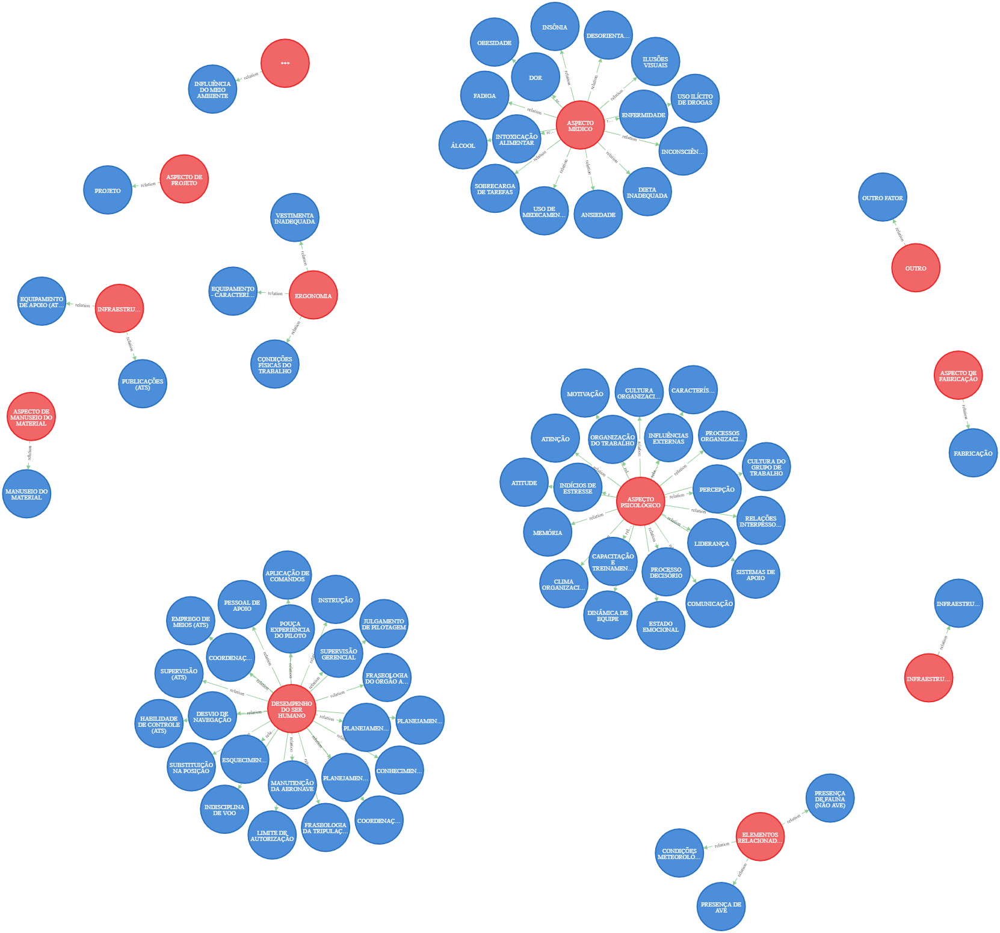

In [ ]:
q4_image = Image(filename='graph4.png')
q4_image

In [ ]:
q5 = '''load csv with headers from "file:///aeronaves.csv " as line
merge (a:aeronave_matricula{name:line.aeronave_matricula})
merge (b:aeronave_tipo_operacao{name:line.aeronave_tipo_operacao})
merge (a)  -[:tipo] -> (b)
return a, b limit 60'''
nodes_q5 = session.run(q5)
for node in nodes_q5:
    print(node)

<Record a=<Node id=5072 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PTNQX'}> b=<Node id=5062 labels=frozenset({'aeronave_tipo_operacao'}) properties={'name': 'PRIVADA'}>>
<Record a=<Node id=5073 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PTLVI'}> b=<Node id=5062 labels=frozenset({'aeronave_tipo_operacao'}) properties={'name': 'PRIVADA'}>>
<Record a=<Node id=5074 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PPPTO'}> b=<Node id=5063 labels=frozenset({'aeronave_tipo_operacao'}) properties={'name': 'REGULAR'}>>
<Record a=<Node id=5075 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PRLGJ'}> b=<Node id=5063 labels=frozenset({'aeronave_tipo_operacao'}) properties={'name': 'REGULAR'}>>
<Record a=<Node id=5076 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PRMAA'}> b=<Node id=5063 labels=frozenset({'aeronave_tipo_operacao'}) properties={'name': 'REGULAR'}>>
<Record a=<Node id=5077 labels=frozenset({'aeronave_mat

`5` - **Airplanes grouped by type of operation (search limited to 60 relationships):**

 It is interesting to note that there are aircraft that fulfill more than one type of applicable operation, some **police aircraft**, for example, appear registered as **regular aircraft** and air **taxi**, possible typo?

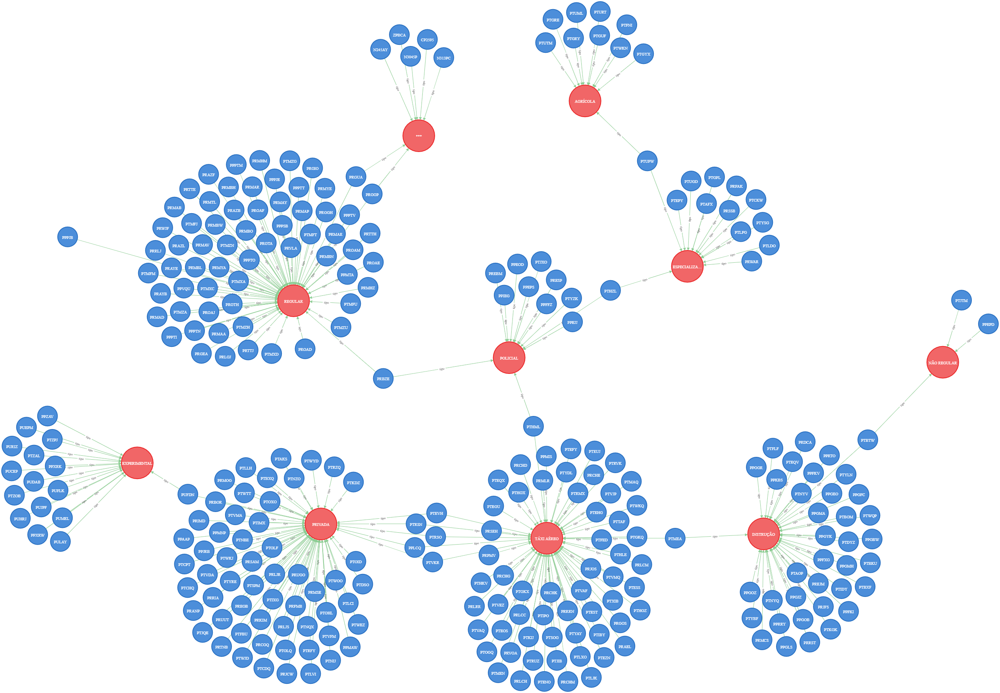

In [ ]:
q5_image = Image(filename='graph5.png')
q5_image

In [ ]:
q6 = '''load csv with headers from "file:///aeronaves.csv" as line
merge (a:aeronave_matricula{name:line.aeronave_matricula})
merge (b:aeronave_nivel_dano{name:line.aeronave_nivel_dano})
merge (a) -[:relação] -> (b)
return a,b '''
nodes_q6 = session.run(q6)
for node in nodes_q6:
    print(node)

<Record a=<Node id=12306 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PTNQX'}> b=<Node id=16609 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'SUBSTANCIAL'}>>
<Record a=<Node id=12307 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PTLVI'}> b=<Node id=16610 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'NENHUM'}>>
<Record a=<Node id=12308 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PPPTO'}> b=<Node id=16611 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'LEVE'}>>
<Record a=<Node id=12309 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PRLGJ'}> b=<Node id=16610 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'NENHUM'}>>
<Record a=<Node id=12310 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PRMAA'}> b=<Node id=16610 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'NENHUM'}>>
<Record a=<Node id=12311 labels=frozenset({'aeronave_matricula

<Record a=<Node id=12857 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PRSED'}> b=<Node id=16611 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'LEVE'}>>
<Record a=<Node id=12858 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PROAT'}> b=<Node id=16610 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'NENHUM'}>>
<Record a=<Node id=12859 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PRWJL'}> b=<Node id=16611 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'LEVE'}>>
<Record a=<Node id=12860 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PTRGY'}> b=<Node id=16611 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'LEVE'}>>
<Record a=<Node id=12861 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PURCJ'}> b=<Node id=16612 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'DESTRUÍDA'}>>
<Record a=<Node id=12862 labels=frozenset({'aeronave_matricula'}) pr

<Record a=<Node id=13323 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PRLYD'}> b=<Node id=16609 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'SUBSTANCIAL'}>>
<Record a=<Node id=13324 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PTGGE'}> b=<Node id=16609 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'SUBSTANCIAL'}>>
<Record a=<Node id=13325 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PUVJO'}> b=<Node id=16609 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'SUBSTANCIAL'}>>
<Record a=<Node id=13326 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PTNKJ'}> b=<Node id=16609 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'SUBSTANCIAL'}>>
<Record a=<Node id=13327 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PUAJO'}> b=<Node id=16612 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'DESTRUÍDA'}>>
<Record a=<Node id=13328 labels=frozenset(

<Record a=<Node id=13523 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PRDKK'}> b=<Node id=16612 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'DESTRUÍDA'}>>
<Record a=<Node id=12833 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PTANF'}> b=<Node id=16609 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'SUBSTANCIAL'}>>
<Record a=<Node id=13524 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PTREY'}> b=<Node id=16610 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'NENHUM'}>>
<Record a=<Node id=13525 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PRNAF'}> b=<Node id=16610 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'NENHUM'}>>
<Record a=<Node id=13526 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PTLSJ'}> b=<Node id=16611 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'LEVE'}>>
<Record a=<Node id=13527 labels=frozenset({'aeronave_matric

<Record a=<Node id=13776 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PRHFC'}> b=<Node id=16610 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'NENHUM'}>>
<Record a=<Node id=13623 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PTYZD'}> b=<Node id=16610 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'NENHUM'}>>
<Record a=<Node id=13973 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PRONC'}> b=<Node id=16610 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'NENHUM'}>>
<Record a=<Node id=13974 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PRMIL'}> b=<Node id=16609 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'SUBSTANCIAL'}>>
<Record a=<Node id=13975 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PTLKG'}> b=<Node id=16612 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'DESTRUÍDA'}>>
<Record a=<Node id=13976 labels=frozenset({'aeronave_matr

<Record a=<Node id=14480 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PRMHI'}> b=<Node id=16611 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'LEVE'}>>
<Record a=<Node id=14481 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PPCGR'}> b=<Node id=16611 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'LEVE'}>>
<Record a=<Node id=14482 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PRLLJ'}> b=<Node id=16610 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'NENHUM'}>>
<Record a=<Node id=14483 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PTHUJ'}> b=<Node id=16610 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'NENHUM'}>>
<Record a=<Node id=14484 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PTMZV'}> b=<Node id=16611 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'LEVE'}>>
<Record a=<Node id=14485 labels=frozenset({'aeronave_matricula'}) prope

<Record a=<Node id=14930 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PROHD'}> b=<Node id=16611 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'LEVE'}>>
<Record a=<Node id=14931 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PTEZQ'}> b=<Node id=16611 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'LEVE'}>>
<Record a=<Node id=13764 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PRVBI'}> b=<Node id=16611 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'LEVE'}>>
<Record a=<Node id=12578 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PPPTN'}> b=<Node id=16611 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'LEVE'}>>
<Record a=<Node id=14932 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PPGSE'}> b=<Node id=16609 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'SUBSTANCIAL'}>>
<Record a=<Node id=14933 labels=frozenset({'aeronave_matricula'}) pr

<Record a=<Node id=14947 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PRFFD'}> b=<Node id=16610 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'NENHUM'}>>
<Record a=<Node id=12403 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PTDYZ'}> b=<Node id=16611 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'LEVE'}>>
<Record a=<Node id=15384 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PTKLW'}> b=<Node id=16610 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'NENHUM'}>>
<Record a=<Node id=15385 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PURCR'}> b=<Node id=16610 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'NENHUM'}>>
<Record a=<Node id=14950 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PRFLE'}> b=<Node id=16611 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'LEVE'}>>
<Record a=<Node id=15386 labels=frozenset({'aeronave_matricula'}) pro

<Record a=<Node id=14050 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PRPAJ'}> b=<Node id=16610 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'NENHUM'}>>
<Record a=<Node id=14834 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PRENM'}> b=<Node id=16609 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'SUBSTANCIAL'}>>
<Record a=<Node id=15855 labels=frozenset({'aeronave_matricula'}) properties={'name': 'DABVR'}> b=<Node id=16610 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'NENHUM'}>>
<Record a=<Node id=15433 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PTVUU'}> b=<Node id=16609 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'SUBSTANCIAL'}>>
<Record a=<Node id=15856 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PRRCS'}> b=<Node id=16609 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'SUBSTANCIAL'}>>
<Record a=<Node id=15857 labels=frozenset({'aerona

<Record a=<Node id=16263 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PREAZ'}> b=<Node id=16611 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'LEVE'}>>
<Record a=<Node id=14192 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PRECB'}> b=<Node id=16610 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'NENHUM'}>>
<Record a=<Node id=16264 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PRVIV'}> b=<Node id=16611 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'LEVE'}>>
<Record a=<Node id=15035 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PRDMV'}> b=<Node id=16610 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'NENHUM'}>>
<Record a=<Node id=16265 labels=frozenset({'aeronave_matricula'}) properties={'name': 'PRNCF'}> b=<Node id=16612 labels=frozenset({'aeronave_nivel_dano'}) properties={'name': 'DESTRUÍDA'}>>
<Record a=<Node id=14172 labels=frozenset({'aeronave_matricula'}) 

`6` - List of aircraft and damage status in the events:

This consultation points out cases in which there are **aircraft destroyed** and with **light damage** at the **same time**;



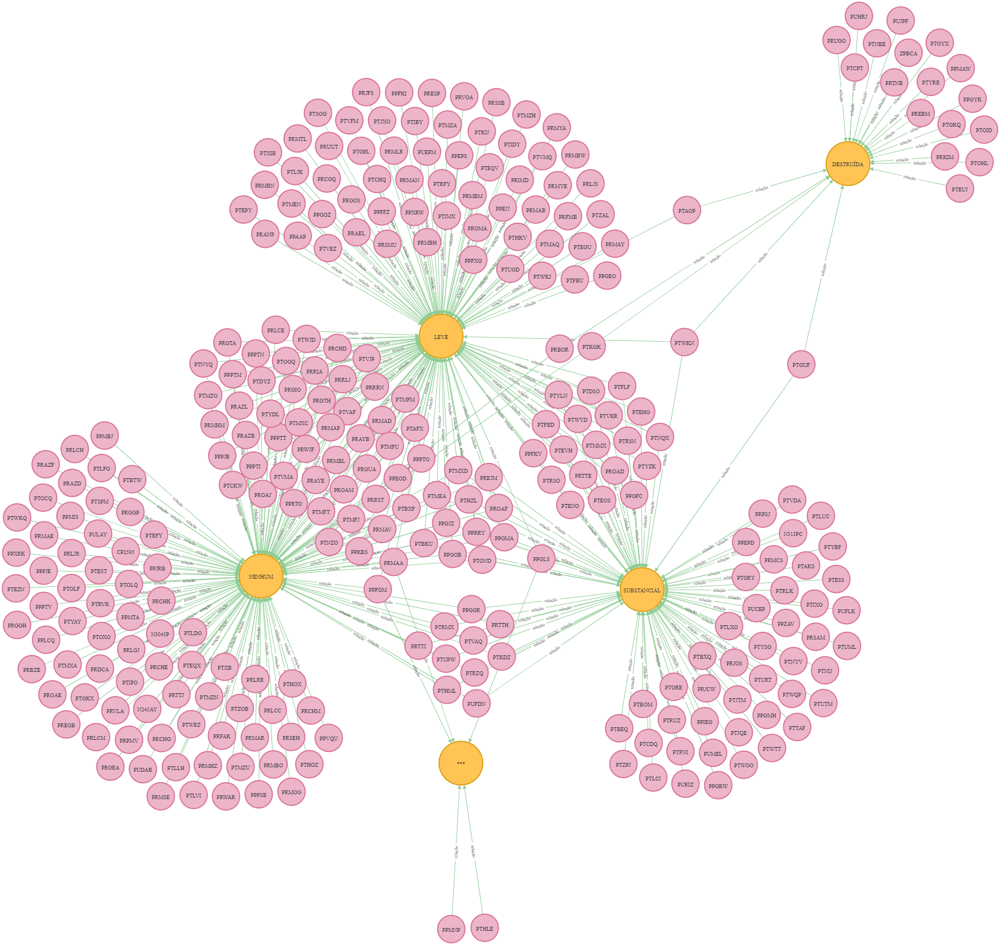

In [ ]:
q6_image = Image(filename='graph6.png')
q6_image

In [ ]:
q7 = '''load csv with headers from "file:///factor_contribuinte.csv" as line
merge (a:codigo_ocorrencia3{name:line.codigo_ocorrencia3})
merge (b:fator_area{name:line.fator_area})
merge (a) -[:relação] ->(b)
return a,b'''
nodes_q7 = session.run(q7)
for node in nodes_q7:
    print(node)

<Record a=<Node id=16614 labels=frozenset({'codigo_ocorrencia3'}) properties={'name': '39115'}> b=<Node id=17766 labels=frozenset({'fator_area'}) properties={'name': 'FATOR OPERACIONAL'}>>
<Record a=<Node id=16614 labels=frozenset({'codigo_ocorrencia3'}) properties={'name': '39115'}> b=<Node id=17766 labels=frozenset({'fator_area'}) properties={'name': 'FATOR OPERACIONAL'}>>
<Record a=<Node id=16614 labels=frozenset({'codigo_ocorrencia3'}) properties={'name': '39115'}> b=<Node id=17767 labels=frozenset({'fator_area'}) properties={'name': 'FATOR HUMANO'}>>
<Record a=<Node id=16614 labels=frozenset({'codigo_ocorrencia3'}) properties={'name': '39115'}> b=<Node id=17766 labels=frozenset({'fator_area'}) properties={'name': 'FATOR OPERACIONAL'}>>
<Record a=<Node id=16614 labels=frozenset({'codigo_ocorrencia3'}) properties={'name': '39115'}> b=<Node id=17766 labels=frozenset({'fator_area'}) properties={'name': 'FATOR OPERACIONAL'}>>
<Record a=<Node id=16614 labels=frozenset({'codigo_ocorrenci

<Record a=<Node id=16740 labels=frozenset({'codigo_ocorrencia3'}) properties={'name': '43658'}> b=<Node id=17767 labels=frozenset({'fator_area'}) properties={'name': 'FATOR HUMANO'}>>
<Record a=<Node id=16740 labels=frozenset({'codigo_ocorrencia3'}) properties={'name': '43658'}> b=<Node id=17767 labels=frozenset({'fator_area'}) properties={'name': 'FATOR HUMANO'}>>
<Record a=<Node id=16740 labels=frozenset({'codigo_ocorrencia3'}) properties={'name': '43658'}> b=<Node id=17767 labels=frozenset({'fator_area'}) properties={'name': 'FATOR HUMANO'}>>
<Record a=<Node id=16740 labels=frozenset({'codigo_ocorrencia3'}) properties={'name': '43658'}> b=<Node id=17767 labels=frozenset({'fator_area'}) properties={'name': 'FATOR HUMANO'}>>
<Record a=<Node id=16740 labels=frozenset({'codigo_ocorrencia3'}) properties={'name': '43658'}> b=<Node id=17767 labels=frozenset({'fator_area'}) properties={'name': 'FATOR HUMANO'}>>
<Record a=<Node id=16740 labels=frozenset({'codigo_ocorrencia3'}) properties={'n

<Record a=<Node id=16887 labels=frozenset({'codigo_ocorrencia3'}) properties={'name': '45282'}> b=<Node id=17766 labels=frozenset({'fator_area'}) properties={'name': 'FATOR OPERACIONAL'}>>
<Record a=<Node id=16887 labels=frozenset({'codigo_ocorrencia3'}) properties={'name': '45282'}> b=<Node id=17767 labels=frozenset({'fator_area'}) properties={'name': 'FATOR HUMANO'}>>
<Record a=<Node id=16887 labels=frozenset({'codigo_ocorrencia3'}) properties={'name': '45282'}> b=<Node id=17766 labels=frozenset({'fator_area'}) properties={'name': 'FATOR OPERACIONAL'}>>
<Record a=<Node id=16887 labels=frozenset({'codigo_ocorrencia3'}) properties={'name': '45282'}> b=<Node id=17767 labels=frozenset({'fator_area'}) properties={'name': 'FATOR HUMANO'}>>
<Record a=<Node id=16887 labels=frozenset({'codigo_ocorrencia3'}) properties={'name': '45282'}> b=<Node id=17766 labels=frozenset({'fator_area'}) properties={'name': 'FATOR OPERACIONAL'}>>
<Record a=<Node id=16887 labels=frozenset({'codigo_ocorrencia3'})

<Record a=<Node id=17069 labels=frozenset({'codigo_ocorrencia3'}) properties={'name': '47981'}> b=<Node id=17767 labels=frozenset({'fator_area'}) properties={'name': 'FATOR HUMANO'}>>
<Record a=<Node id=17069 labels=frozenset({'codigo_ocorrencia3'}) properties={'name': '47981'}> b=<Node id=17767 labels=frozenset({'fator_area'}) properties={'name': 'FATOR HUMANO'}>>
<Record a=<Node id=17069 labels=frozenset({'codigo_ocorrencia3'}) properties={'name': '47981'}> b=<Node id=17767 labels=frozenset({'fator_area'}) properties={'name': 'FATOR HUMANO'}>>
<Record a=<Node id=17069 labels=frozenset({'codigo_ocorrencia3'}) properties={'name': '47981'}> b=<Node id=17766 labels=frozenset({'fator_area'}) properties={'name': 'FATOR OPERACIONAL'}>>
<Record a=<Node id=17069 labels=frozenset({'codigo_ocorrencia3'}) properties={'name': '47981'}> b=<Node id=17766 labels=frozenset({'fator_area'}) properties={'name': 'FATOR OPERACIONAL'}>>
<Record a=<Node id=17069 labels=frozenset({'codigo_ocorrencia3'}) prop

<Record a=<Node id=17271 labels=frozenset({'codigo_ocorrencia3'}) properties={'name': '52240'}> b=<Node id=17766 labels=frozenset({'fator_area'}) properties={'name': 'FATOR OPERACIONAL'}>>
<Record a=<Node id=17271 labels=frozenset({'codigo_ocorrencia3'}) properties={'name': '52240'}> b=<Node id=17766 labels=frozenset({'fator_area'}) properties={'name': 'FATOR OPERACIONAL'}>>
<Record a=<Node id=17272 labels=frozenset({'codigo_ocorrencia3'}) properties={'name': '52263'}> b=<Node id=17766 labels=frozenset({'fator_area'}) properties={'name': 'FATOR OPERACIONAL'}>>
<Record a=<Node id=17273 labels=frozenset({'codigo_ocorrencia3'}) properties={'name': '52264'}> b=<Node id=17767 labels=frozenset({'fator_area'}) properties={'name': 'FATOR HUMANO'}>>
<Record a=<Node id=17273 labels=frozenset({'codigo_ocorrencia3'}) properties={'name': '52264'}> b=<Node id=17767 labels=frozenset({'fator_area'}) properties={'name': 'FATOR HUMANO'}>>
<Record a=<Node id=17273 labels=frozenset({'codigo_ocorrencia3'})

<Record a=<Node id=17430 labels=frozenset({'codigo_ocorrencia3'}) properties={'name': '53561'}> b=<Node id=17767 labels=frozenset({'fator_area'}) properties={'name': 'FATOR HUMANO'}>>
<Record a=<Node id=17430 labels=frozenset({'codigo_ocorrencia3'}) properties={'name': '53561'}> b=<Node id=17767 labels=frozenset({'fator_area'}) properties={'name': 'FATOR HUMANO'}>>
<Record a=<Node id=17431 labels=frozenset({'codigo_ocorrencia3'}) properties={'name': '53562'}> b=<Node id=17767 labels=frozenset({'fator_area'}) properties={'name': 'FATOR HUMANO'}>>
<Record a=<Node id=17431 labels=frozenset({'codigo_ocorrencia3'}) properties={'name': '53562'}> b=<Node id=17766 labels=frozenset({'fator_area'}) properties={'name': 'FATOR OPERACIONAL'}>>
<Record a=<Node id=17431 labels=frozenset({'codigo_ocorrencia3'}) properties={'name': '53562'}> b=<Node id=17766 labels=frozenset({'fator_area'}) properties={'name': 'FATOR OPERACIONAL'}>>
<Record a=<Node id=17431 labels=frozenset({'codigo_ocorrencia3'}) prop

<Record a=<Node id=17616 labels=frozenset({'codigo_ocorrencia3'}) properties={'name': '77724'}> b=<Node id=17767 labels=frozenset({'fator_area'}) properties={'name': 'FATOR HUMANO'}>>
<Record a=<Node id=17617 labels=frozenset({'codigo_ocorrencia3'}) properties={'name': '77726'}> b=<Node id=17766 labels=frozenset({'fator_area'}) properties={'name': 'FATOR OPERACIONAL'}>>
<Record a=<Node id=17617 labels=frozenset({'codigo_ocorrencia3'}) properties={'name': '77726'}> b=<Node id=17767 labels=frozenset({'fator_area'}) properties={'name': 'FATOR HUMANO'}>>
<Record a=<Node id=17617 labels=frozenset({'codigo_ocorrencia3'}) properties={'name': '77726'}> b=<Node id=17767 labels=frozenset({'fator_area'}) properties={'name': 'FATOR HUMANO'}>>
<Record a=<Node id=17617 labels=frozenset({'codigo_ocorrencia3'}) properties={'name': '77726'}> b=<Node id=17766 labels=frozenset({'fator_area'}) properties={'name': 'FATOR OPERACIONAL'}>>
<Record a=<Node id=17617 labels=frozenset({'codigo_ocorrencia3'}) prop

 `7` - **Aircraft involved in events and their triggering factors;**

Few occurrences have **more than one trigger**;

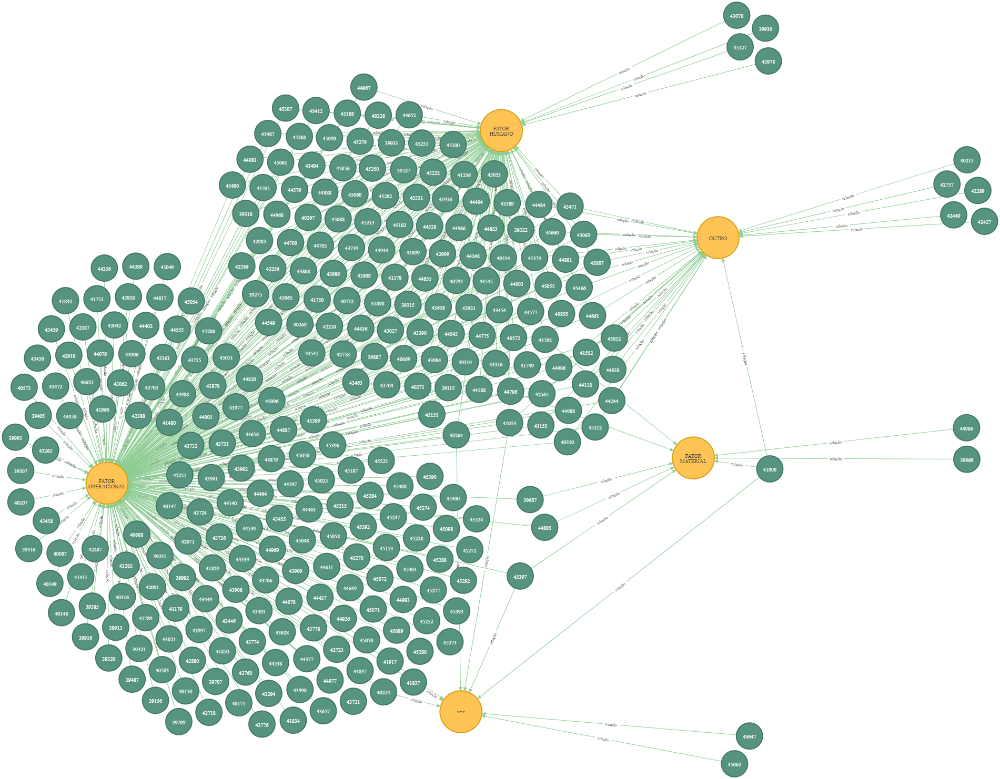

In [ ]:
q7_image = Image(filename='graph7.png')
q7_image

In [ ]:
q8 = '''load csv with headers from 'file:///aeronaves.csv' as line
merge (a:codigo_ocorrencia2{name:line.codigo_ocorrencia2})
merge (b:investigacao_status{name:line.aeronave_registro_categoria})
merge (a) -[:relação] -> (b)
return a,b
limit 150'''
nodes_q8 = session.run(q8)
for node in nodes_q8:
    print(node)

<Record a=<Node id=18419 labels=frozenset({'codigo_ocorrencia2'}) properties={'name': '39115'}> b=<Node id=24312 labels=frozenset({'investigacao_status'}) properties={'name': 'AVIÃO'}>>
<Record a=<Node id=18420 labels=frozenset({'codigo_ocorrencia2'}) properties={'name': '39155'}> b=<Node id=24312 labels=frozenset({'investigacao_status'}) properties={'name': 'AVIÃO'}>>
<Record a=<Node id=18421 labels=frozenset({'codigo_ocorrencia2'}) properties={'name': '39156'}> b=<Node id=24312 labels=frozenset({'investigacao_status'}) properties={'name': 'AVIÃO'}>>
<Record a=<Node id=18422 labels=frozenset({'codigo_ocorrencia2'}) properties={'name': '39158'}> b=<Node id=24312 labels=frozenset({'investigacao_status'}) properties={'name': 'AVIÃO'}>>
<Record a=<Node id=18423 labels=frozenset({'codigo_ocorrencia2'}) properties={'name': '39176'}> b=<Node id=24312 labels=frozenset({'investigacao_status'}) properties={'name': 'AVIÃO'}>>
<Record a=<Node id=18424 labels=frozenset({'codigo_ocorrencia2'}) prop

`8` - **Occurrences regarding the aircraft category:**

It is to be expected that **planes** will be more constant in the CENIPA dataset, however. note that **helicopters** and **microlights** also appear in consultations.

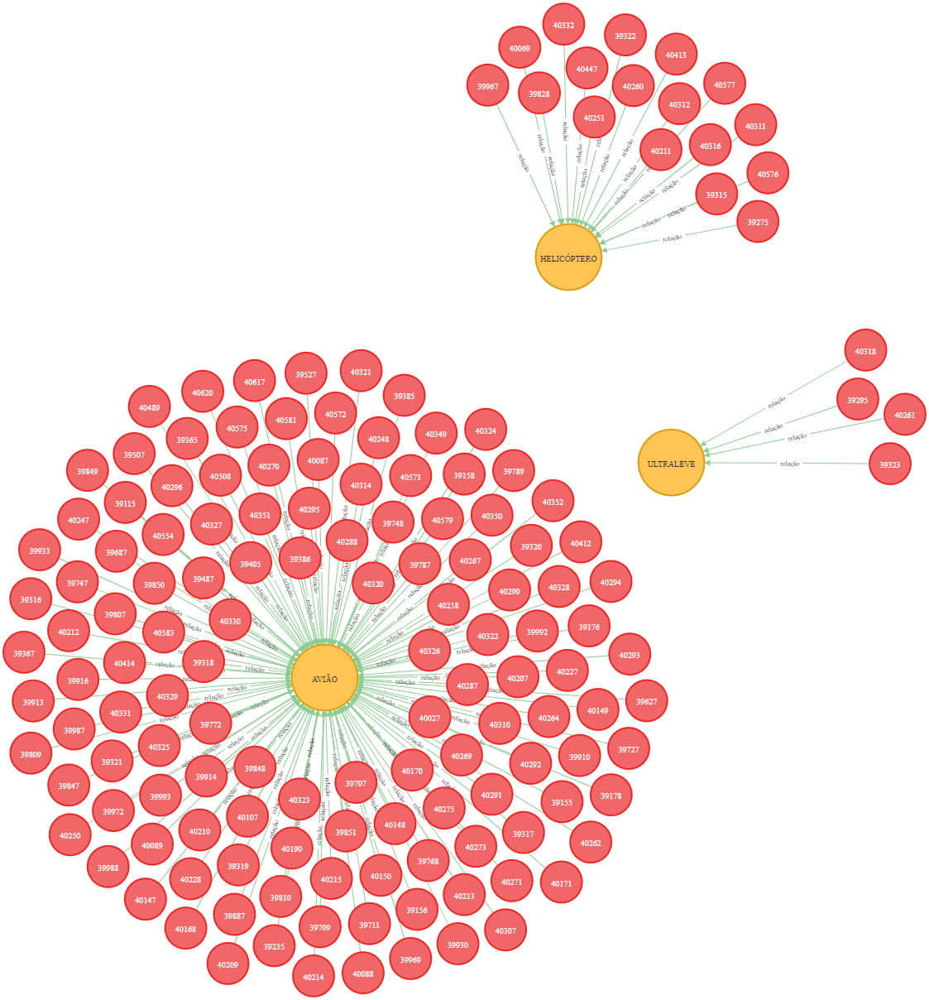

In [ ]:
q8_image = Image(filename='graph8.png')
q8_image